[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/NicolasJorquera/sorting-algorithms/blob/main/detailed-sorting-algorithms/bubble-sort.ipynb)

# Bubble sort
Bubble Sort is one of the simplest and most well-known sorting algorithms. Despite its simplicity, it is not the most efficient when dealing with large datasets. It belongs to the family of comparison-based sorting algorithms, meaning it sorts by comparing elements.

In [ ]:
import matplotlib.pyplot as plt
import time
import random
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import numpy as np

In [ ]:
# Define array to test every algorithm
n = 50
array = [0]  * n
for i in range(n):
    array[i] = random.randint(0, n)

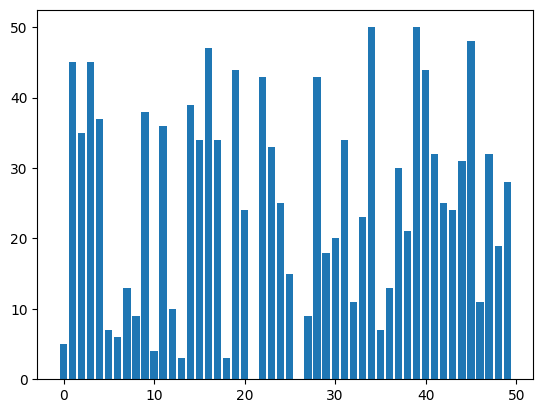

In [ ]:
plt.bar(range(len(array)), array)
plt.show()

## How it works
Bubble Sort repeatedly steps through a list, compares adjacent elements, and swaps them if they are in the wrong order. This process is repeated until no more swaps are needed, indicating that the list is sorted.

Here's a step-by-step breakdown of the process:


### 1.   Start at the beginning of the list:

*   Compare the first two adjacent elements in the list.
*   If the first element is greater than the second, swap them.
*   If the first element is smaller or equal, do nothing.

  
### 2.   Move to the next pair:

*   Continue comparing and swapping adjacent elements, moving from the left to the right of the list.

### 3.  End of the pass:

*   Once the end of the list is reached, the largest element will have "bubbled" to the last position in the list (hence the name "Bubble Sort").
*   At this point, the list is partially sorted, but the largest element is correctly placed at the end.

### 4.  Repeat for remaining unsorted elements:

*   Ignore the last sorted element (since it's already in its correct position) and repeat the same process for the remaining unsorted elements.
*   With each pass, the number of elements to consider reduces by 1.

### 5.  Termination:

*   The algorithm stops when a pass is made without any swaps, indicating the list is completely sorted.

In [ ]:
def bubble_sort(array):
    data = array.copy()
    n = len(data)
    steps = []

    for i in range(n):
        for j in range(0, n - i - 1):
            if data[j] > data[j + 1]:
                data[j], data[j + 1] = data[j + 1], data[j]
                steps.append(data.copy())
    return steps

## Example of Bubble sort in action

Let’s consider an example where we sort the list [5, 2, 9, 1, 5, 6] in ascending order.

**First pass:**

* Compare 5 and 2. Since 5 > 2, swap them. The list becomes [2, 5, 9, 1, 5, 6].
* Compare 5 and 9. No swap needed as 5 < 9.
* Compare 9 and 1. Since 9 > 1, swap them. The list becomes [2, 5, 1, 9, 5, 6].
* Compare 9 and 5. Since 9 > 5, swap them. The list becomes [2, 5, 1, 5, 9, 6].
* Compare 9 and 6. Since 9 > 6, swap them. The list becomes [2, 5, 1, 5, 6, 9].
Now, the largest element 9 is correctly placed at the end of the list.

**Second pass:**

* Compare 2 and 5. No swap needed as 2 < 5.
* Compare 5 and 1. Since 5 > 1, swap them. The list becomes [2, 1, 5, 5, 6, 9].
* Compare 5 and 5. No swap needed as both are equal.
* Compare 5 and 6. No swap needed as 5 < 6.
Now, 6 is correctly placed at the second last position, and the list is partially sorted.

**Third pass:**

* Compare 2 and 1. Since 2 > 1, swap them. The list becomes [1, 2, 5, 5, 6, 9].
* Compare 2 and 5. No swap needed as 2 < 5.
* Compare 5 and 5. No swap needed as both are equal.


Now, the list is fully sorted.

In [ ]:
steps = bubble_sort(array)

In [ ]:
def update(frame, bars, steps):
    for bar, height in zip(bars, steps[frame]):
        bar.set_height(height)
    return bars

fig, ax = plt.subplots()
plt.close(fig)
bars = ax.bar(range(len(array)), array)
ax.set_title("Bubble Sort Visualization")

ani = FuncAnimation(
    fig, update, frames=len(steps), fargs=(bars, steps), interval=300, repeat=True
)

HTML(ani.to_jshtml())

## Time complexity
The time complexity of Bubble Sort is O(n²), where n is the number of elements in the list.

* Worst-case complexity: In the worst case (when the list is in reverse order), Bubble Sort will perform n - 1 passes, and in each pass, it will compare and potentially swap each pair of adjacent elements. This results in approximately n² comparisons and swaps.

* Best-case complexity: In the best case (when the list is already sorted), the algorithm will make only one pass through the list to check that no swaps are needed, resulting in a time complexity of O(n).

* Average-case complexity: In the average case, Bubble Sort will still need to compare and swap elements, leading to a time complexity of O(n²).

## Space complexity
The space complexity of Bubble Sort is O(1), meaning it is a constant space algorithm. This is because the sorting is done in place, and no extra space is required apart from a few temporary variables used for swapping.

## Pros and Cons of Bubble Sort
**Pros:**

* Simplicity: Bubble Sort is very easy to understand and implement.
* In-place sorting: It doesn't require additional memory or space apart from the input array.


**Cons:**

* Inefficiency: Bubble Sort is inefficient for large datasets. The O(n²) time complexity means it performs poorly when the number of elements is large.
* Redundant comparisons: Even if the list is already sorted, the algorithm still performs unnecessary comparisons (though it can be optimized by checking if a pass was made without any swaps).

## Optimized Version of Bubble Sort

An optimization to the algorithm is to keep track of whether any swaps were made during a pass. If no swaps were made, the list is already sorted, and we can terminate early.

Here’s the optimized version:


```python
def bubble_sort(arr):
    n = len(arr)
    for i in range(n):
        swapped = False
        for j in range(0, n - i - 1):
            if arr[j] > arr[j + 1]:
                arr[j], arr[j + 1] = arr[j + 1], arr[j]  # Swap
                swapped = True
        if not swapped:
            break  # No swaps, array is already sorted

```


This optimized version reduces unnecessary passes through the list when it's already sorted, improving the best-case time complexity to O(n).

## Conclusion

While Bubble Sort is intuitive and easy to understand, it is inefficient for large datasets due to its quadratic time complexity. In practice, more efficient algorithms such as Merge Sort, Quick Sort, or even Insertion Sort are preferred for larger datasets. However, Bubble Sort remains a useful educational tool for understanding basic sorting mechanisms and the concept of algorithmic efficiency.